In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import required packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt ##plotting libraries
%matplotlib inline
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score,KFold
import matplotlib.pyplot as plt

In [3]:
# Read the given CSV file, and view some sample records

advertising = pd.read_csv("data.csv")
advertising.head()

,click,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,device_id,...,C17,C18,C19,C20,C21,month,dayofweek,day,hour,y
0,False,1005,1,856e6d3f,58a89a43,f028772b,ecad2386,7801e8d9,07d7df22,a99f214a,...,2528,0,39,100075,221,10,1,28,14,0
1,True,1005,1,e151e245,7e091613,f028772b,ecad2386,7801e8d9,07d7df22,a99f214a,...,1934,2,39,-1,16,10,2,22,19,1
2,False,1005,0,e3c09f3a,d262cf1e,28905ebd,ecad2386,7801e8d9,07d7df22,a99f214a,...,2552,3,167,100202,23,10,3,23,18,0
3,False,1002,0,0da94452,248e439f,50e219e0,ecad2386,7801e8d9,07d7df22,0fa578fd,...,2478,3,167,100074,23,10,2,22,19,0
4,True,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,a99f214a,...,1722,0,35,-1,79,10,1,21,8,1


In [4]:
advertising.shape

(99999, 27)

In [5]:
advertising.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   click             99999 non-null  bool  
 1   C1                99999 non-null  int64 
 2   banner_pos        99999 non-null  int64 
 3   site_id           99999 non-null  object
 4   site_domain       99999 non-null  object
 5   site_category     99999 non-null  object
 6   app_id            99999 non-null  object
 7   app_domain        99999 non-null  object
 8   app_category      99999 non-null  object
 9   device_id         99999 non-null  object
 10  device_ip         99999 non-null  object
 11  device_model      99999 non-null  object
 12  device_type       99999 non-null  int64 
 13  device_conn_type  99999 non-null  int64 
 14  C14               99999 non-null  int64 
 15  C15               99999 non-null  int64 
 16  C16               99999 non-null  int64 
 17  C17         

In [6]:
advertising.describe()

,C1,banner_pos,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21,month,dayofweek,day,hour,y
count,99999.000000,99999.000000,99999.00000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.0,99999.000000,99999.000000,99999.000000,99999.000000
mean,1004.967550,0.289943,1.01639,0.329453,18857.231732,318.834548,60.278743,2114.613036,1.439904,227.234932,53292.001950,83.163542,10.0,2.592836,25.485755,11.300673,0.169802
std,1.091916,0.505707,0.53110,0.854673,4944.919482,21.510752,47.713436,607.469442,1.326824,351.472366,49952.340367,70.161076,0.0,1.723003,2.968520,5.938725,0.375460
min,1001.000000,0.000000,0.00000,0.000000,375.000000,120.000000,20.000000,112.000000,0.000000,33.000000,-1.000000,1.000000,10.0,0.000000,21.000000,0.000000,0.000000
25%,1005.000000,0.000000,1.00000,0.000000,16920.000000,320.000000,50.000000,1863.000000,0.000000,35.000000,-1.000000,23.000000,10.0,1.000000,23.000000,7.000000,0.000000
50%,1005.000000,0.000000,1.00000,0.000000,20346.000000,320.000000,50.000000,2323.000000,2.000000,39.000000,100050.000000,61.000000,10.0,2.000000,26.000000,11.000000,0.000000
75%,1005.000000,1.000000,1.00000,0.000000,21893.000000,320.000000,50.000000,2526.000000,3.000000,171.000000,100093.000000,101.000000,10.0,4.000000,28.000000,16.000000,0.000000
max,1012.000000,7.000000,5.00000,5.000000,24043.000000,1024.000000,1024.000000,2757.000000,3.000000,1839.000000,100248.000000,255.000000,10.0,6.000000,30.000000,23.000000,1.000000


In [7]:
advertising.isna().sum()

click               0
C1                  0
banner_pos          0
site_id             0
site_domain         0
site_category       0
app_id              0
app_domain          0
app_category        0
device_id           0
device_ip           0
device_model        0
device_type         0
device_conn_type    0
C14                 0
C15                 0
C16                 0
C17                 0
C18                 0
C19                 0
C20                 0
C21                 0
month               0
dayofweek           0
day                 0
hour                0
y                   0
dtype: int64

In [8]:
#Check for duplicates
advertising.drop_duplicates().shape == advertising.shape

False

In [9]:
#Drop Duplicates
advertising.drop_duplicates()

,click,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,app_category,device_id,...,C17,C18,C19,C20,C21,month,dayofweek,day,hour,y
0,False,1005,1,856e6d3f,58a89a43,f028772b,ecad2386,7801e8d9,07d7df22,a99f214a,...,2528,0,39,100075,221,10,1,28,14,0
1,True,1005,1,e151e245,7e091613,f028772b,ecad2386,7801e8d9,07d7df22,a99f214a,...,1934,2,39,-1,16,10,2,22,19,1
2,False,1005,0,e3c09f3a,d262cf1e,28905ebd,ecad2386,7801e8d9,07d7df22,a99f214a,...,2552,3,167,100202,23,10,3,23,18,0
3,False,1002,0,0da94452,248e439f,50e219e0,ecad2386,7801e8d9,07d7df22,0fa578fd,...,2478,3,167,100074,23,10,2,22,19,0
4,True,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,a99f214a,...,1722,0,35,-1,79,10,1,21,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,False,1005,0,7294ea0f,863fa89d,3e814130,ecad2386,7801e8d9,07d7df22,a99f214a,...,1973,3,39,100148,23,10,3,23,15,0
99995,False,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,07d7df22,a99f214a,...,2545,0,167,100084,221,10,2,29,0,0
99996,True,1005,0,85f751fd,c4e18dd6,50e219e0,7358e05e,b9528b13,cef3e649,927c68c6,...,2443,2,39,-1,23,10,2,22,15,1
99997,True,1005,0,5b08c53b,7687a86e,3e814130,ecad2386,7801e8d9,07d7df22,a99f214a,...,2295,2,35,100081,23,10,5,25,8,1


In [10]:
print("banner_pos", advertising.banner_pos.unique())
print("site_id", advertising.site_id.unique())
print("site_domain", advertising.site_domain.unique())
print("site_category", advertising.site_category.unique())
print("app_id", advertising.app_id.unique())
print("app_domain", advertising.app_domain.unique())
print("app_category", advertising.app_category.unique())
print("device_id", advertising.device_id.unique())
print("device_ip", advertising.device_ip.unique())
print("device_model", advertising.device_model.unique())
print("device_type", advertising.device_type.unique())
print("device_conn_type", advertising.device_conn_type.unique())
print("Month", advertising.month.unique())
print("Dayofweek", advertising.dayofweek.unique())
print("Day", advertising.day.unique())
print("Hour", advertising.hour.unique())
print("Click", advertising.y.unique())

banner_pos [1 0 4 7 2 5 3]
site_id ['856e6d3f' 'e151e245' 'e3c09f3a' ... '565fc7e8' 'f1e5d855' 'bf991633']
site_domain ['58a89a43' '7e091613' 'd262cf1e' ... '07c73c13' 'aa3a901c' 'bde22369']
site_category ['f028772b' '28905ebd' '50e219e0' '3e814130' 'f66779e6' '335d28a8'
 '75fa27f6' 'dedf689d' '76b2941d' '72722551' 'c0dd3be3' 'a818d37a'
 '70fb0e29' '8fd0aea4' '0569f928' '42a36e14' '9ccfa2ea' 'e787de0e'
 '5378d028']
app_id ['ecad2386' '98fed791' 'fc6dc16f' ... 'f6e20ea3' 'e8600768' 'a821a6b6']
app_domain ['7801e8d9' 'd9b5648e' '5c5a694b' '82e27996' 'ae637522' '2347f47a'
 'b9528b13' 'b8d325c3' '33da2e74' '0e8616ad' 'aefc06bd' '5c620f04'
 'c6824def' '6f7ca2ba' '885c7f3f' 'b5f3b24a' '9ec164d3' 'df32afa9'
 '5b9c592b' '2b627705' 'ad63ec9b' '0654b444' 'f2f777fb' '45a51db4'
 'a8b0bf20' 'bb6bcbae' 'b7af3e0a' 'ef1fc174' '99b4c806' '43cf4f06'
 'dcdba109' 'e5d5313f' '8a1d880a' '828da833' '6a0a3a9d' '15ec7f39'
 '3feeed1e' '3c992420' 'fc41b20c' '57cf0548' 'd6feb1a4' '448ca2e3'
 '063914ab' '7eec2ab0'

In [11]:
# Dropping month as the data set is only for october month
advertising.drop(['month'],axis=1,inplace = True)

In [12]:
advertising.drop(['C1','C14','C15','C16','C17','C18','C19','C20','C21'],axis=1,inplace = True)

In [13]:
advertising.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   click             99999 non-null  bool  
 1   banner_pos        99999 non-null  int64 
 2   site_id           99999 non-null  object
 3   site_domain       99999 non-null  object
 4   site_category     99999 non-null  object
 5   app_id            99999 non-null  object
 6   app_domain        99999 non-null  object
 7   app_category      99999 non-null  object
 8   device_id         99999 non-null  object
 9   device_ip         99999 non-null  object
 10  device_model      99999 non-null  object
 11  device_type       99999 non-null  int64 
 12  device_conn_type  99999 non-null  int64 
 13  dayofweek         99999 non-null  int64 
 14  day               99999 non-null  int64 
 15  hour              99999 non-null  int64 
 16  y                 99999 non-null  int64 
dtypes: bool(1), 

False    83019
True     16980
Name: click, dtype: int64


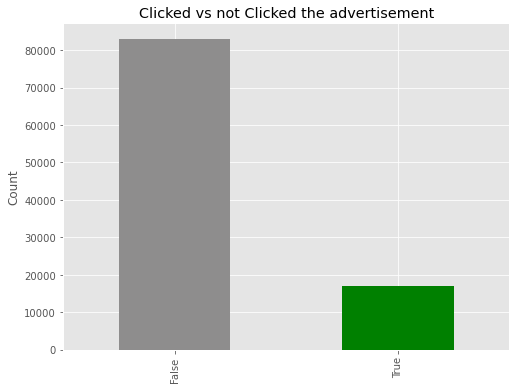

In [14]:
# Clicked vs not Clicked the advertisement
print(advertising["click"].value_counts())

plt.style.use('ggplot')
colors = ["#8E8D8D", "#008000"]
advertising["click"].value_counts().plot.bar(figsize=(8,6),color=colors)
plt.title('Clicked vs not Clicked the advertisement')
plt.ylabel('Count')
plt.show()

In [15]:
#find the overall click through rate
advertising['click'].value_counts()/len(advertising)

False    0.830198
True     0.169802
Name: click, dtype: float64

Overall click through rate close to 17% and 83% didn't click the advertisement

In [16]:
advertising.hour.describe()

count    99999.000000
mean        11.300673
std          5.938725
min          0.000000
25%          7.000000
50%         11.000000
75%         16.000000
max         23.000000
Name: hour, dtype: float64

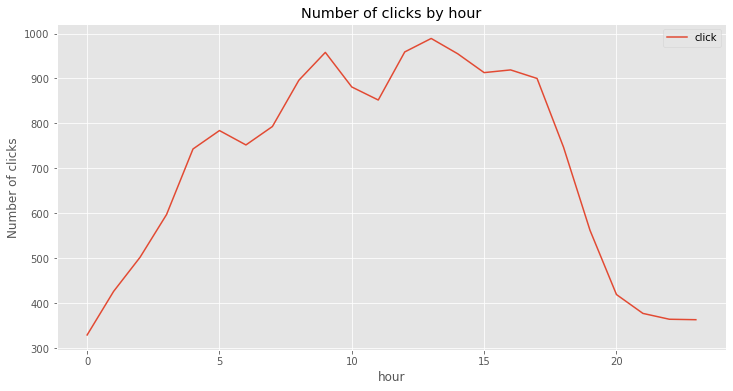

In [17]:
advertising.groupby('hour').agg({'click':'sum'}).plot(figsize=(12,6))
plt.ylabel('Number of clicks')
plt.title('Number of clicks by hour');

0    71778
1    28052
7      107
2       30
4       19
5        9
3        4
Name: banner_pos, dtype: int64


<AxesSubplot:xlabel='banner_pos', ylabel='count'>

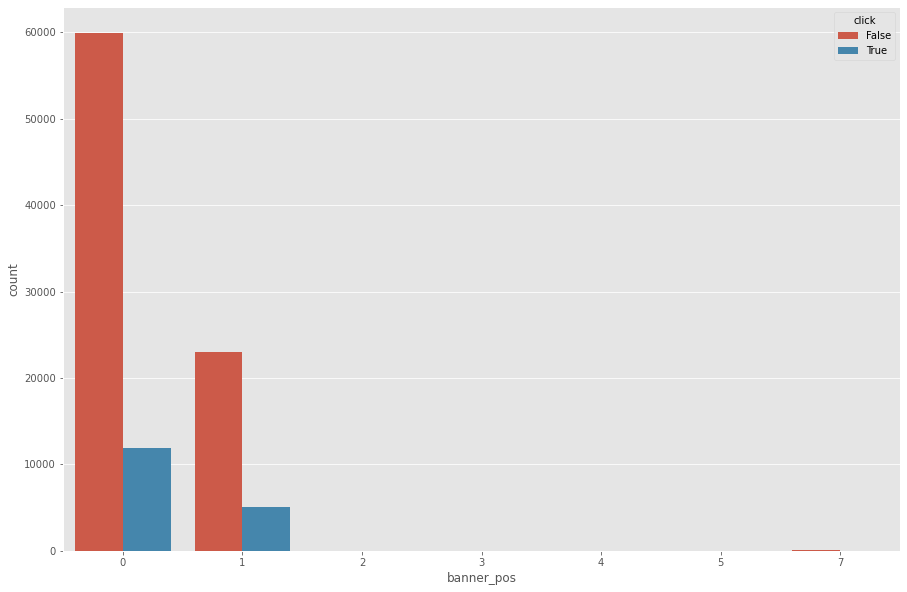

In [18]:
# Clicks by banner position
print(advertising["banner_pos"].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='banner_pos',hue='click',data=advertising)

<AxesSubplot:xlabel='hour', ylabel='count'>

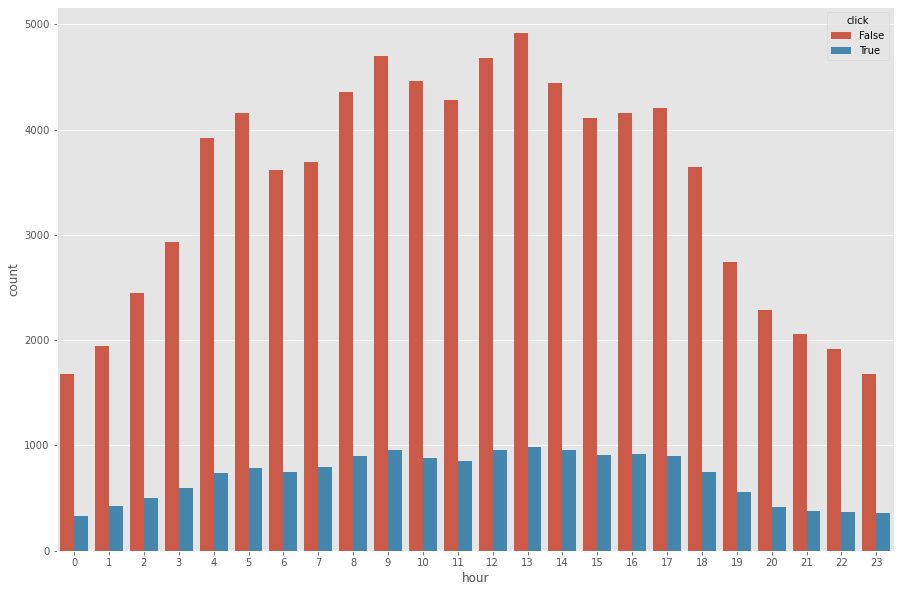

In [19]:
# Clicks per hour
plt.figure(figsize=(15,10))
sns.countplot(x='hour',hue='click',data=advertising)

In [20]:
#advertising.describe()

### Analyse by device type

1    92239
0     5494
4     1931
5      335
Name: device_type, dtype: int64


<AxesSubplot:xlabel='device_type', ylabel='count'>

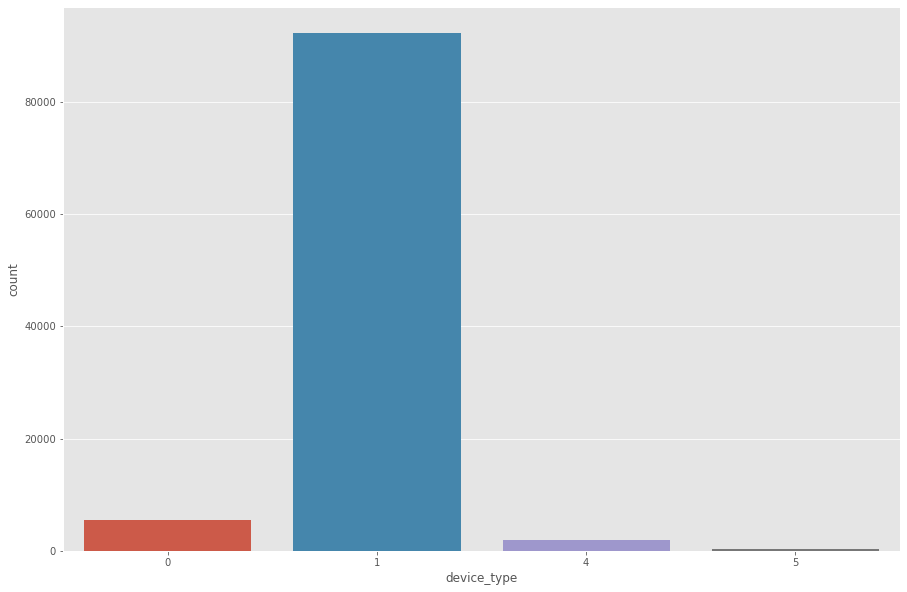

In [21]:
#Clicks by device type
print(advertising["device_type"].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='device_type', data=advertising)

Device type 1 of four types of devices is the most prevalent.

click        False   True
device_type              
0             4288   1206
1            76688  15551
4             1747    184
5              296     39


<AxesSubplot:xlabel='device_type'>

<Figure size 1080x720 with 0 Axes>

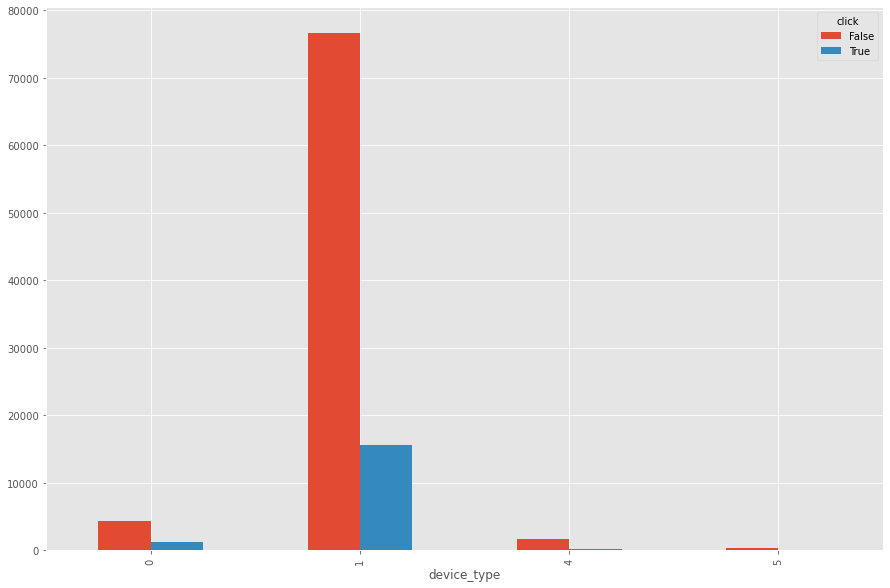

In [22]:
advertising_device_type = pd.crosstab(index=advertising["device_type"], columns=advertising["click"])
print(advertising_device_type)
plt.figure(figsize=(15,10))
advertising_device_type.plot(kind="bar", figsize=(15,10), stacked=False)

In [23]:
(advertising_device_type[1]/len(advertising.device_type))*100

device_type
0     1.206012
1    15.551156
4     0.184002
5     0.039000
Name: True, dtype: float64

The click ratios per device_type is highest for device type 1 (92239) is 15.55%, and lowest is for device type 5, 0.039%. Hence device_type is a good feature for predicting our target variable.

### Analyse by device connection type

0    86413
2     8043
3     5428
5      115
Name: device_conn_type, dtype: int64


<AxesSubplot:xlabel='device_conn_type', ylabel='count'>

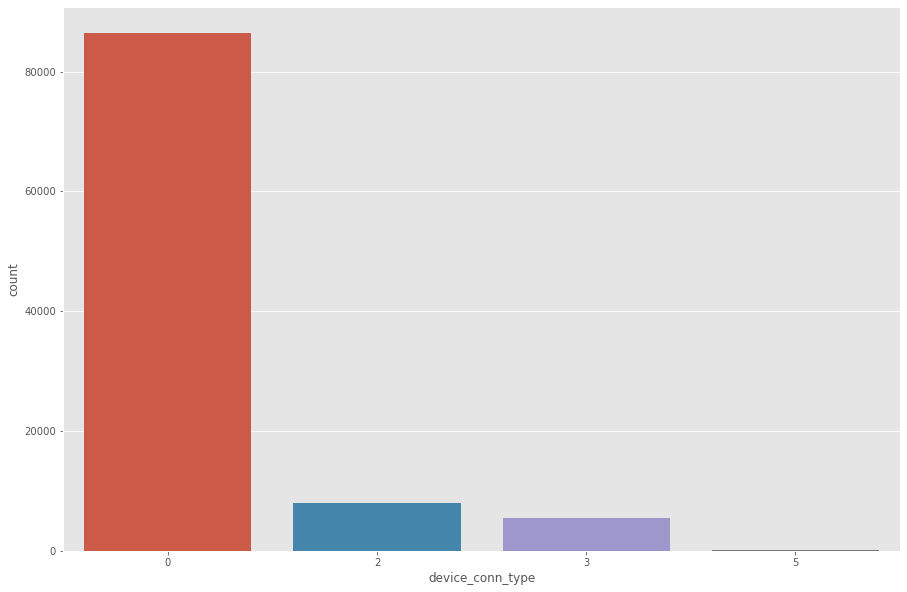

In [24]:
#Clicks by device connection type
print(advertising["device_conn_type"].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='device_conn_type', data=advertising)

click             False   True
device_conn_type              
0                 70780  15633
2                  6978   1065
3                  5150    278
5                   111      4


<AxesSubplot:xlabel='device_conn_type'>

<Figure size 1080x720 with 0 Axes>

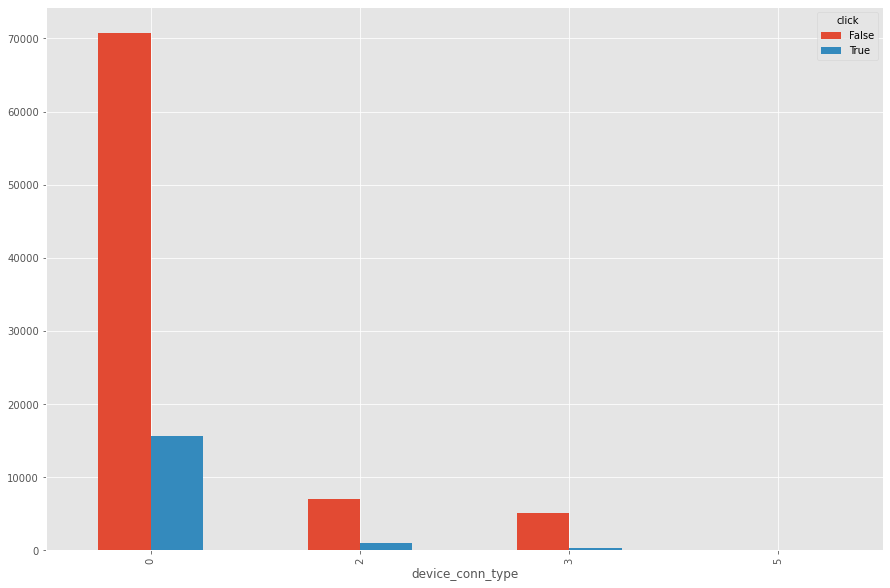

In [25]:
advertising_device_conn_type = pd.crosstab(index=advertising["device_conn_type"], columns=advertising["click"])
print(advertising_device_conn_type)
plt.figure(figsize=(15,10))
advertising_device_conn_type.plot(kind="bar", figsize=(15,10), stacked=False)

In [26]:
(advertising_device_conn_type[1]/len(advertising.device_conn_type))*100

device_conn_type
0    15.633156
2     1.065011
3     0.278003
5     0.004000
Name: True, dtype: float64

The click ratios per device_type is highest for device connection type 0 (86413) is 15.63%, and lowest is for device type 5, 0.004%. Hence device connection type is a good feature for predicting our target variable.

### Evaluate correation between variable
Before proceeding further check the correlation between variables to have independent set of features in our model.

In [27]:
# Dropping click as y has the numberical value of click column 1 is True and 0 is False
advertising.drop(['click'],axis=1,inplace = True)
advertising.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   banner_pos        99999 non-null  int64 
 1   site_id           99999 non-null  object
 2   site_domain       99999 non-null  object
 3   site_category     99999 non-null  object
 4   app_id            99999 non-null  object
 5   app_domain        99999 non-null  object
 6   app_category      99999 non-null  object
 7   device_id         99999 non-null  object
 8   device_ip         99999 non-null  object
 9   device_model      99999 non-null  object
 10  device_type       99999 non-null  int64 
 11  device_conn_type  99999 non-null  int64 
 12  dayofweek         99999 non-null  int64 
 13  day               99999 non-null  int64 
 14  hour              99999 non-null  int64 
 15  y                 99999 non-null  int64 
dtypes: int64(7), object(9)
memory usage: 12.2+ MB


In [28]:
advertising.corr()

,banner_pos,device_type,device_conn_type,dayofweek,day,hour,y
banner_pos,1.000000,0.323849,-0.085357,0.012731,0.022989,-0.006446,0.021371
device_type,0.323849,1.000000,0.209228,0.005621,-0.011406,0.014420,-0.038931
device_conn_type,-0.085357,0.209228,1.000000,0.022777,0.047121,0.032161,-0.081340
dayofweek,0.012731,0.005621,0.022777,1.000000,-0.009846,0.010143,0.014000
day,0.022989,-0.011406,0.047121,-0.009846,1.000000,0.043435,-0.007852
hour,-0.006446,0.014420,0.032161,0.010143,0.043435,1.000000,0.002128
y,0.021371,-0.038931,-0.081340,0.014000,-0.007852,0.002128,1.000000


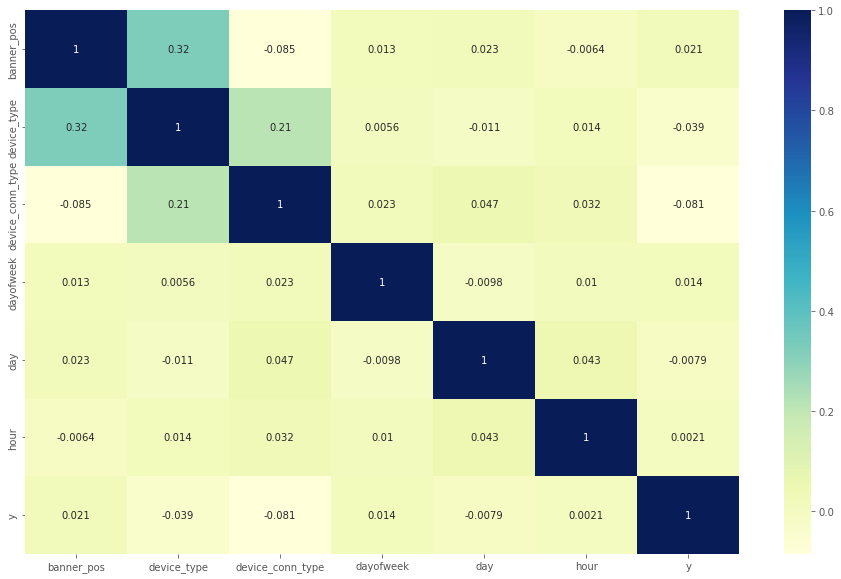

In [29]:
plt.figure(figsize = (16, 10))
sns.heatmap(advertising.corr(), annot = True, cmap="YlGnBu")
plt.show()

We can observe the following from the above correlation 
1. The highest positive correlation is between banner_pos and device_type.
2. Id is not correlated to any of the features.

In [30]:
#Drop non informative variables like ID's
advertising.drop(["site_id", "app_id", "device_id", "device_ip"],axis=1,inplace = True)

In [31]:
# Check for missing values
advertising.isnull().sum().sort_values(ascending=False)

banner_pos          0
site_domain         0
site_category       0
app_domain          0
app_category        0
device_model        0
device_type         0
device_conn_type    0
dayofweek           0
day                 0
hour                0
y                   0
dtype: int64

### Decision trees

In [32]:
advertising.head()

,banner_pos,site_domain,site_category,app_domain,app_category,device_model,device_type,device_conn_type,dayofweek,day,hour,y
0,1,58a89a43,f028772b,7801e8d9,07d7df22,be6db1d7,1,0,1,28,14,0
1,1,7e091613,f028772b,7801e8d9,07d7df22,1b13b020,1,0,2,22,19,1
2,0,d262cf1e,28905ebd,7801e8d9,07d7df22,9a45a8e8,1,0,3,23,18,0
3,0,248e439f,50e219e0,7801e8d9,07d7df22,ea6abc60,0,0,2,22,19,0
4,0,f3845767,28905ebd,7801e8d9,07d7df22,36d749e5,1,0,1,21,8,1


In [33]:
# Dummy variable for catagorical variables
df_transformed_dt1 = pd.get_dummies(advertising)

In [34]:
df_transformed_dt1.head()

,banner_pos,device_type,device_conn_type,dayofweek,day,hour,y,site_domain_005b495a,site_domain_00dda4fc,site_domain_00e1b9c0,...,device_model_ff607a1a,device_model_ff717dd1,device_model_ff91ea03,device_model_ff963f16,device_model_ffb16766,device_model_ffc70ef9,device_model_ffcd1497,device_model_ffceddb3,device_model_ffe3ae81,device_model_ffe69079
0,1,1,0,1,28,14,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,0,2,22,19,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,0,3,23,18,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,2,22,19,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,1,21,8,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Spliting into train and test data

In [35]:
# load sklearn libraries required to construct a Decision Tree
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics

In [36]:
df_transformed_dt1.rename(columns = {'y':'click'}, inplace = True)
X_dt1 = df_transformed_dt1.drop('click', axis=1)
Y_dt1 = df_transformed_dt1['click']

In [37]:
X_dt1.head(1)

,banner_pos,device_type,device_conn_type,dayofweek,day,hour,site_domain_005b495a,site_domain_00dda4fc,site_domain_00e1b9c0,site_domain_0150cc3e,...,device_model_ff607a1a,device_model_ff717dd1,device_model_ff91ea03,device_model_ff963f16,device_model_ffb16766,device_model_ffc70ef9,device_model_ffcd1497,device_model_ffceddb3,device_model_ffe3ae81,device_model_ffe69079
0,1,1,0,1,28,14,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
Y_dt1.head(1)

0    0
Name: click, dtype: int64

In [39]:
X_train_dt1, X_test_dt1, Y_train_dt1, Y_test_dt1 = train_test_split(X_dt1, Y_dt1, test_size=0.2, random_state=0)

In [40]:
print(X_train_dt1.shape) 
print(X_test_dt1.shape) 
print(Y_train_dt1.shape) 
print(Y_test_dt1.shape)

(79999, 4618)
(20000, 4618)
(79999,)
(20000,)


In [41]:
# Create a Decision Tree
dt_basic_dt1 =  DecisionTreeClassifier(max_depth=10)

In [42]:
# View the attributes of tree created
dt_basic_dt1

DecisionTreeClassifier(max_depth=10)

In [43]:
# Fit the training data
dt_basic_dt1.fit(X_train_dt1, Y_train_dt1)

DecisionTreeClassifier(max_depth=10)

In [44]:
# Predict based on test data
Y_preds_dt1 = dt_basic_dt1.predict(X_test_dt1)

In [45]:
# View the predictions
Y_preds_dt1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [46]:
Y_test_dt1

3582     0
60498    0
53227    0
21333    1
3885     0
        ..
60116    0
2415     0
43763    0
71344    0
82259    0
Name: click, Length: 20000, dtype: int64

In [47]:
# Calculate Accuracy
accuracy_value_dt1 = metrics.accuracy_score(Y_test_dt1, Y_preds_dt1)

In [48]:
# View the accuracy
accuracy_value_dt1

0.82885

In [49]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_dt1=cross_val_score(dt_basic_dt1, X_train_dt1, Y_train_dt1,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_dt1))
print("Train SetAverage Cross Validation score :{}".format(score_train_dt1.mean()))
score_test_dt1=cross_val_score(dt_basic_dt1, X_test_dt1, Y_test_dt1,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_dt1))
print("TestSetAverage Cross Validation score :{}".format(score_test_dt1.mean()))

Train Set Cross Validation Scores are [0.827375   0.830625   0.8306875  0.8344375  0.82892681]
Train SetAverage Cross Validation score :0.8304103615850991
TestSet Cross Validation Scores are [0.82975 0.82275 0.82875 0.8255  0.83225]
TestSetAverage Cross Validation score :0.8277999999999999


[[16455   138]
 [ 3285   122]]


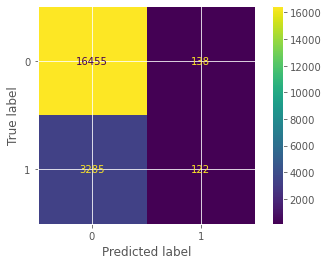

In [50]:
# Create and print confusion matrix 
cnf_matrix_dt1 = metrics.confusion_matrix(Y_test_dt1, Y_preds_dt1)
print(cnf_matrix_dt1)
metrics.plot_confusion_matrix(dt_basic_dt1, X_test_dt1, Y_test_dt1)
plt.show()

In [51]:
# Print the confusion matrix
print(classification_report(Y_test_dt1, Y_preds_dt1))

              precision    recall  f1-score   support

           0       0.83      0.99      0.91     16593
           1       0.47      0.04      0.07      3407

    accuracy                           0.83     20000
   macro avg       0.65      0.51      0.49     20000
weighted avg       0.77      0.83      0.76     20000



In [52]:
# Calculate the number of nodes in the tree
dt_basic_dt1.tree_.node_count

527

In [53]:
roc_auc_score(Y_test_dt1, dt_basic_dt1.predict_proba(X_test_dt1)[:, 1])

0.6846827314859061

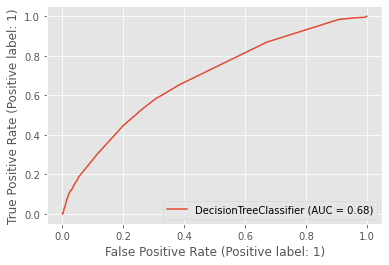

In [54]:
metrics.plot_roc_curve(dt_basic_dt1, X_test_dt1, Y_test_dt1) 
plt.show()

In [55]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pydotplus, graphviz

In [56]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin'

In [57]:
#Select input columns as features
features_dt1=list(X_dt1.columns[0:])

In [58]:
features_dt1

['banner_pos',
 'device_type',
 'device_conn_type',
 'dayofweek',
 'day',
 'hour',
 'site_domain_005b495a',
 'site_domain_00dda4fc',
 'site_domain_00e1b9c0',
 'site_domain_0150cc3e',
 'site_domain_01b51870',
 'site_domain_01cb1dc6',
 'site_domain_01f9b380',
 'site_domain_021dbcbe',
 'site_domain_022ab9c6',
 'site_domain_026faf38',
 'site_domain_0316bf4f',
 'site_domain_0322ae72',
 'site_domain_03cc62db',
 'site_domain_04001ead',
 'site_domain_04205356',
 'site_domain_0445c666',
 'site_domain_047f7e80',
 'site_domain_05025b96',
 'site_domain_0515458a',
 'site_domain_0521e204',
 'site_domain_055e86af',
 'site_domain_057254ad',
 'site_domain_05882f11',
 'site_domain_05a2f6dd',
 'site_domain_060c1a43',
 'site_domain_0619dcd1',
 'site_domain_0627be18',
 'site_domain_068d6886',
 'site_domain_06908927',
 'site_domain_06cbcce3',
 'site_domain_07012454',
 'site_domain_07c73c13',
 'site_domain_081b7abd',
 'site_domain_087af27e',
 'site_domain_08ba7db9',
 'site_domain_08ebf0db',
 'site_domain_08f

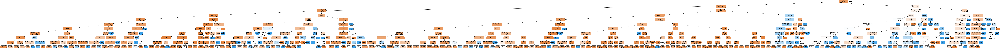

In [59]:
#Visualise the tree using the following steps:
dot_data = StringIO()  
export_graphviz(dt_basic_dt1, out_file=dot_data,
                feature_names=features_dt1, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparamter Tuning Optimization

In [60]:
# Prepearing the data
df_transformed_dt2 = pd.get_dummies(advertising)
df_transformed_dt2.rename(columns = {'y':'click'}, inplace = True)
X_dt2 = df_transformed_dt2.drop('click', axis=1)
Y_dt2 = df_transformed_dt2['click']
X_train_dt2, X_test_dt2, Y_train_dt2, Y_test_dt2 = train_test_split(X_dt2, Y_dt2, test_size=0.2, random_state=0)

In [61]:
#Choose and mention the hyperparameter
parameters_dt2={'max_depth': range(1,10)}

In [62]:
#You can define number of folds for cross-validation as follows:
n_folds =  5

In [63]:
#Build a Decision Tree
dtree_dt2 =DecisionTreeClassifier(criterion='gini', random_state=0)
dtree_dt2

DecisionTreeClassifier(random_state=0)

In [64]:
#Import the required libraries
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [65]:
#Use GridSearchCV to buid a tree
tree_dt2 = GridSearchCV(dtree_dt2, parameters_dt2, cv=n_folds, scoring="accuracy", return_train_score=True)

In [66]:
#Fit the training data
tree_dt2.fit(X_train_dt2,Y_train_dt2)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'max_depth': range(1, 10)}, return_train_score=True,
             scoring='accuracy')

In [67]:
#View the score
scores_dt2 = tree_dt2.cv_results_
scores_dt2

{'mean_fit_time': array([11.1892921 , 10.60259657,  9.23852806, 10.41352162, 11.70209436,
        13.63999486, 14.02897739, 15.24107575, 15.84917707]),
 'std_fit_time': array([2.20832958, 2.29671745, 0.26398214, 0.19380402, 0.46193767,
        0.99999042, 0.95834556, 0.83072743, 0.95285726]),
 'mean_score_time': array([0.89252939, 0.65644317, 0.52910075, 0.48930454, 0.50448308,
        0.51361647, 0.51288719, 0.5904829 , 0.49411421]),
 'std_score_time': array([0.11877537, 0.17552446, 0.04633917, 0.03019753, 0.01884199,
        0.04123823, 0.03164311, 0.1198435 , 0.02522545]),
 'param_max_depth': masked_array(data=[1, 2, 3, 4, 5, 6, 7, 8, 9],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'params': [{'max_depth': 1},
  {'max_depth': 2},
  {'max_depth': 3},
  {'max_depth': 4},
  {'max_depth': 5},
  {'max_depth': 6},
  {'max_depth': 7},
  {'max_depth': 8},
  {'max_depth': 9}],
 's

In [68]:
# Predict based on test data and evaluate and print condusion matrix
Y_preds_dt2 = tree_dt2.predict(X_test_dt2)
accuracy_value_dt2 = metrics.accuracy_score(Y_test_dt2, Y_preds_dt2)
print("Accuracy", accuracy_value_dt2)
confusion_matrix(Y_test_dt2, Y_preds_dt2)
print(classification_report(Y_test_dt2, Y_preds_dt2))

Accuracy 0.8323
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     16593
           1       0.60      0.05      0.09      3407

    accuracy                           0.83     20000
   macro avg       0.72      0.52      0.50     20000
weighted avg       0.80      0.83      0.77     20000



In [69]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_dt2=cross_val_score(tree_dt2, X_train_dt2, Y_train_dt2,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_dt2))
print("Train SetAverage Cross Validation score :{}".format(score_train_dt2.mean()))
score_test_dt2=cross_val_score(tree_dt2, X_test_dt2, Y_test_dt2,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_dt2))
print("TestSetAverage Cross Validation score :{}".format(score_test_dt2.mean()))

Train Set Cross Validation Scores are [0.82825    0.8309375  0.831375   0.835625   0.82961435]
Train SetAverage Cross Validation score :0.8311603701793862
TestSet Cross Validation Scores are [0.8335  0.82675 0.833   0.83225 0.832  ]
TestSetAverage Cross Validation score :0.8314999999999999


[[16485   108]
 [ 3246   161]]


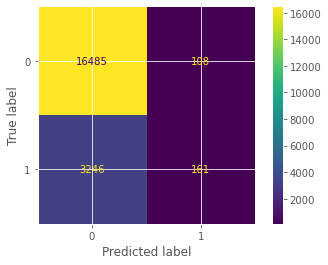

In [70]:
# Create and print confusion matrix
cnf_matrix_dt2 = metrics.confusion_matrix(Y_test_dt2, Y_preds_dt2)
print(cnf_matrix_dt2)
metrics.plot_confusion_matrix(tree_dt2, X_test_dt2, Y_test_dt2)
plt.show()

In [71]:
pd.DataFrame(scores_dt2).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.189292,2.208330,0.892529,0.118775,1,{'max_depth': 1},0.830313,0.830313,0.830313,0.830375,...,0.830335,0.000028,8,0.830341,0.830341,0.830341,0.830325,0.830328,0.830335,0.000007
1,10.602597,2.296717,0.656443,0.175524,2,{'max_depth': 2},0.829937,0.830313,0.830313,0.830375,...,0.830260,0.000163,9,0.830419,0.830341,0.830341,0.830325,0.830328,0.830351,0.000035
2,9.238528,0.263982,0.529101,0.046339,3,{'max_depth': 3},0.831187,0.832063,0.830562,0.831125,...,0.831373,0.000554,2,0.831513,0.831388,0.831560,0.831622,0.831359,0.831489,0.000100
3,10.413522,0.193804,0.489305,0.030198,4,{'max_depth': 4},0.831375,0.832063,0.830438,0.831063,...,0.831398,0.000617,1,0.831716,0.831435,0.831747,0.831763,0.831719,0.831676,0.000122
4,11.702094,0.461938,0.504483,0.018842,5,{'max_depth': 5},0.831438,0.832000,0.830313,0.831000,...,0.831360,0.000651,3,0.831919,0.831794,0.831950,0.831950,0.831922,0.831907,0.000058


In [72]:
scores_dt2["param_max_depth"]

masked_array(data=[1, 2, 3, 4, 5, 6, 7, 8, 9],
             mask=[False, False, False, False, False, False, False, False,
                   False],
       fill_value='?',
            dtype=object)

In [73]:
roc_auc_score(Y_test_dt2, tree_dt2.predict_proba(X_test_dt2)[:, 1])

0.6239323834241388

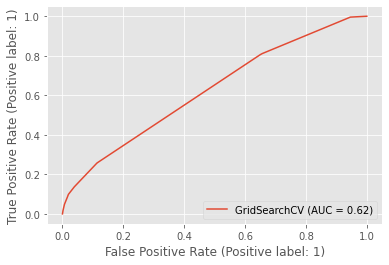

In [74]:
metrics.plot_roc_curve(tree_dt2, X_test_dt2, Y_test_dt2) 
plt.show()

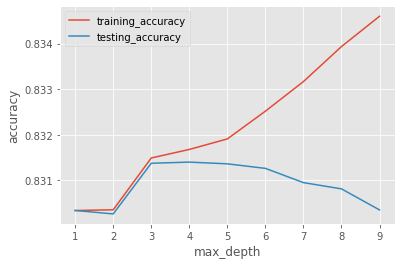

In [75]:
# Plot accuracy vs param_max_depth
plt.figure
plt.plot(scores_dt2["param_max_depth"].data, scores_dt2["mean_train_score"], label="training_accuracy")
plt.plot(scores_dt2["param_max_depth"].data, scores_dt2["mean_test_score"], label="testing_accuracy")
plt.xlabel("max_depth")
plt.ylabel("accuracy")
plt.legend()
plt.show()

In [76]:
tree_dt2.best_params_

{'max_depth': 4}

Identify the optimal Min_samples_leaf

In [77]:
df_transformed_dt3 = pd.get_dummies(advertising)
df_transformed_dt3.rename(columns = {'y':'click'}, inplace = True)
X_dt3 = df_transformed_dt3.drop('click', axis=1)
Y_dt3 = df_transformed_dt3['click']
X_train_dt3, X_test_dt3, Y_train_dt3, Y_test_dt3 = train_test_split(X_dt3, Y_dt3, test_size=0.2, random_state=0)

In [78]:
# Choose and mention the hyperparameter
parameters_dt3 ={'min_samples_leaf':range(10,200,20)}

In [79]:
# Build a Decision Tree
dtree_dt3 = DecisionTreeClassifier(criterion='gini', random_state=0)

In [80]:
# Build the treeecd c
n_fold = 5
tree_dt3 = GridSearchCV(dtree_dt3, parameters_dt3, cv=n_folds, scoring="accuracy", return_train_score=True)

In [81]:
# Fit the training data
tree_dt3.fit(X_train_dt3,Y_train_dt3)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'min_samples_leaf': range(10, 200, 20)},
             return_train_score=True, scoring='accuracy')

In [82]:
scores_dt3 =  tree_dt3.cv_results_
scores_dt3

{'mean_fit_time': array([30.58990045, 29.44647894, 27.20388327, 26.75943871, 25.08159814,
        24.74440355, 23.93533616, 22.73570361, 26.59496837, 24.20912776]),
 'std_fit_time': array([3.76262962, 4.4501966 , 5.43552353, 4.45916244, 4.91707241,
        4.21914886, 4.04106845, 2.61104115, 6.3787342 , 2.96063646]),
 'mean_score_time': array([0.50470829, 0.51525645, 0.53835964, 0.50863891, 0.51175714,
        0.54733362, 0.50221734, 0.54086308, 0.59691091, 0.53799   ]),
 'std_score_time': array([0.03517992, 0.03522011, 0.04154625, 0.01868415, 0.02946026,
        0.04539374, 0.02675865, 0.01825753, 0.05286022, 0.03858923]),
 'param_min_samples_leaf': masked_array(data=[10, 30, 50, 70, 90, 110, 130, 150, 170, 190],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'params': [{'min_samples_leaf': 10},
  {'min_samples_leaf': 30},
  {'min_samples_leaf': 50},
  {'min_samples_lea

In [83]:
# Predict based on test data and print classification report
Y_preds_dt3 = tree_dt3.predict(X_test_dt3)
accuracy_value_dt3 = metrics.accuracy_score(Y_test_dt3, Y_preds_dt3)
print("Accuracy", accuracy_value_dt3)
confusion_matrix(Y_test_dt3, Y_preds_dt3)
print(classification_report(Y_test_dt3, Y_preds_dt3))

Accuracy 0.83225
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     16593
           1       0.65      0.03      0.06      3407

    accuracy                           0.83     20000
   macro avg       0.74      0.51      0.48     20000
weighted avg       0.80      0.83      0.76     20000



In [84]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_dt3=cross_val_score(tree_dt3, X_train_dt3, Y_train_dt3,cv=kf)
print("Train DataSet Cross Validation Scores are {}".format(score_train_dt3))
print("Train DataSet Average Cross Validation score :{}".format(score_train_dt3.mean()))
score_test_dt3=cross_val_score(tree_dt3, X_test_dt3, Y_test_dt3,cv=kf)
print("Test DataSet Cross Validation Scores are {}".format(score_test_dt3))
print("Test DataSet Average Cross Validation score :{}".format(score_test_dt3.mean()))

Train DataSet Cross Validation Scores are [0.8279375  0.8324375  0.830375   0.8341875  0.83030189]
Train DataSet Average Cross Validation score :0.8310478787736735
Test DataSet Cross Validation Scores are [0.832   0.82525 0.834   0.83175 0.83025]
Test DataSet Average Cross Validation score :0.83065


[[16534    59]
 [ 3296   111]]


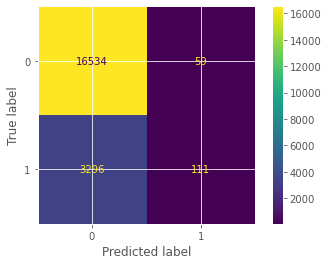

In [85]:
# Create and print confusion matrix
cnf_matrix_dt3 = metrics.confusion_matrix(Y_test_dt3, Y_preds_dt3)
print(cnf_matrix_dt3)
metrics.plot_confusion_matrix(tree_dt3, X_test_dt3, Y_test_dt3)
plt.show()

In [86]:
pd.DataFrame(scores_dt3).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,30.589900,3.762630,0.504708,0.035180,10,{'min_samples_leaf': 10},0.821562,0.824500,0.819813,0.822063,...,0.822023,0.001501,10,0.840544,0.840091,0.840951,0.840732,0.840516,0.840567,0.000284
1,29.446479,4.450197,0.515256,0.035220,30,{'min_samples_leaf': 30},0.828438,0.830688,0.828125,0.828812,...,0.829173,0.000944,9,0.834122,0.833966,0.834451,0.834201,0.833703,0.834089,0.000248
2,27.203883,5.435524,0.538360,0.041546,50,{'min_samples_leaf': 50},0.828937,0.832000,0.828937,0.830250,...,0.830510,0.001477,6,0.833247,0.832576,0.833263,0.833122,0.832547,0.832951,0.000322
3,26.759439,4.459162,0.508639,0.018684,70,{'min_samples_leaf': 70},0.830187,0.832125,0.829125,0.830187,...,0.830935,0.001435,3,0.832919,0.832107,0.832841,0.832982,0.832406,0.832651,0.000339
4,25.081598,4.917072,0.511757,0.029460,90,{'min_samples_leaf': 90},0.830375,0.832313,0.828688,0.828750,...,0.830560,0.001695,5,0.832576,0.832029,0.832576,0.832169,0.831812,0.832232,0.000302


In [87]:
roc_auc_score(Y_test_dt3, tree_dt3.predict_proba(X_test_dt3)[:, 1])

0.7007037527945724

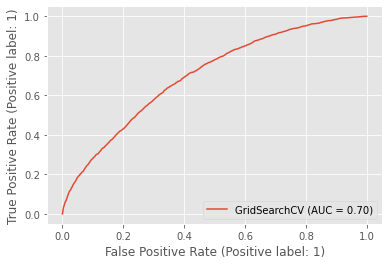

In [88]:
metrics.plot_roc_curve(tree_dt3, X_test_dt3, Y_test_dt3) 
plt.show()

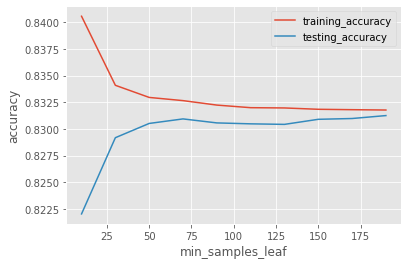

In [89]:
# Plot accuracy vs param_min_samples_leaf
plt.figure
plt.plot(scores_dt3["param_min_samples_leaf"].data, scores_dt3["mean_train_score"], label="training_accuracy")
plt.plot(scores_dt3["param_min_samples_leaf"].data, scores_dt3["mean_test_score"], label="testing_accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.legend()
plt.show()

In [90]:
tree_dt3.best_params_

{'min_samples_leaf': 190}

### Multiple parameters

In [91]:
# Preparing the dataset
df_transformed_dt4 = pd.get_dummies(advertising)
df_transformed_dt4.rename(columns = {'y':'click'}, inplace = True)
X_dt4 = df_transformed_dt4.drop('click', axis=1)
Y_dt4 = df_transformed_dt4['click']
X_train_dt4, X_test_dt4, Y_train_dt4, Y_test_dt4 = train_test_split(X_dt4, Y_dt4, test_size=0.2, random_state=0)

In [92]:
# Create a Parameter grid
param_grid_dt4 = {
    'max_depth': range(5,10,5),
    'min_samples_leaf': range(50,200,50),
    'min_samples_split': range(50,150,50),
    'criterion':['gini','entropy']
    
}
n_folds=5
param_grid_dt4

{'max_depth': range(5, 10, 5),
 'min_samples_leaf': range(50, 200, 50),
 'min_samples_split': range(50, 150, 50),
 'criterion': ['gini', 'entropy']}

In [93]:
# Create a Decision Tree
dtree_dt4=DecisionTreeClassifier()
dtree_dt4

DecisionTreeClassifier()

In [94]:
# Create a Grid with parameters
grid_dt4 = GridSearchCV(dtree_dt4, param_grid_dt4, cv=n_folds, n_jobs=1,return_train_score=True)
grid_dt4.fit(X_train_dt4,Y_train_dt4)
grid_dt4.cv_results_

{'mean_fit_time': array([13.32542882, 14.35056715, 12.7902523 , 12.62749972, 13.61905313,
        13.79917989, 13.27112212, 13.35917001, 13.40764079, 14.57517252,
        13.57273545, 13.28439422]),
 'std_fit_time': array([1.09003279, 1.58530115, 0.18762514, 0.30037449, 0.43426598,
        1.18375426, 0.23683156, 0.3213668 , 0.25564483, 0.8262904 ,
        0.79830137, 0.32151681]),
 'mean_score_time': array([0.57705173, 0.60945292, 0.5531631 , 0.5453001 , 0.57134619,
        0.55562   , 0.52179141, 0.55693145, 0.54877205, 0.55330763,
        0.56746268, 0.55428762]),
 'std_score_time': array([0.02874863, 0.09100674, 0.03697242, 0.03152451, 0.04848505,
        0.02255107, 0.01856239, 0.01959314, 0.0239695 , 0.04668927,
        0.02835859, 0.03051444]),
 'param_criterion': masked_array(data=['gini', 'gini', 'gini', 'gini', 'gini', 'gini',
                    'entropy', 'entropy', 'entropy', 'entropy', 'entropy',
                    'entropy'],
              mask=[False, False, False, Fal

In [95]:
cv_result_dt4=pd.DataFrame(grid_dt4.cv_results_)

In [96]:
grid_dt4.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 50,
 'min_samples_split': 50}

In [97]:
grid_dt4.best_score_

0.8312854006500405

In [98]:
best_grid_dt4=grid_dt4.best_estimator_

In [99]:
best_grid_dt4.fit(X_train_dt4,Y_train_dt4)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=50,
                       min_samples_split=50)

In [100]:
best_grid_dt4.score(X_test_dt4,Y_test_dt4)

0.83225

In [101]:
# Predict based on test data and print classification report
Y_preds_dt4 = best_grid_dt4.predict(X_test_dt4)
accuracy_value_dt4 = metrics.accuracy_score(Y_test_dt4, Y_preds_dt4)
print("Accuracy", accuracy_value_dt4)
confusion_matrix(Y_test_dt4, Y_preds_dt4)
print(classification_report(Y_test_dt4, Y_preds_dt4))

Accuracy 0.83225
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     16593
           1       0.64      0.03      0.06      3407

    accuracy                           0.83     20000
   macro avg       0.74      0.52      0.49     20000
weighted avg       0.80      0.83      0.76     20000



In [102]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_dt4=cross_val_score(best_grid_dt4, X_train_dt4, Y_train_dt4,cv=kf)
print("Train DataSet Cross Validation Scores are {}".format(score_train_dt4))
print("Train DataSet Average Cross Validation score :{}".format(score_train_dt4.mean()))
score_test_dt4=cross_val_score(best_grid_dt4, X_test_dt4, Y_test_dt4,cv=kf)
print("Test DataSet Cross Validation Scores are {}".format(score_test_dt4))
print("Test DataSet Average Cross Validation score :{}".format(score_test_dt4.mean()))

Train DataSet Cross Validation Scores are [0.8276875  0.8316875  0.830875   0.8345625  0.82980186]
Train DataSet Average Cross Validation score :0.8309228725232828
Test DataSet Cross Validation Scores are [0.83425 0.82575 0.834   0.83075 0.83225]
Test DataSet Average Cross Validation score :0.8314


[[16529    64]
 [ 3291   116]]


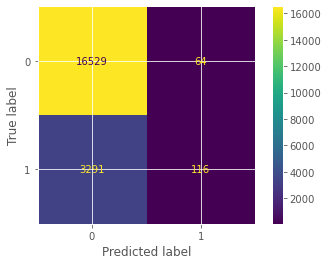

In [103]:
# Create and print confusion matrix
cnf_matrix_dt4 = metrics.confusion_matrix(Y_test_dt4, Y_preds_dt4)
print(cnf_matrix_dt4)
metrics.plot_confusion_matrix(best_grid_dt4, X_test_dt4, Y_test_dt4)
plt.show()

In [104]:
roc_auc_score(Y_test_dt4, best_grid_dt4.predict_proba(X_test_dt4)[:, 1])

0.6127517764120582

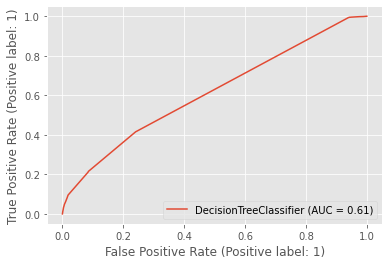

In [105]:
metrics.plot_roc_curve(best_grid_dt4, X_test_dt4, Y_test_dt4) 
plt.show()

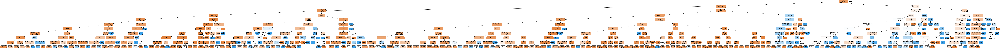

In [106]:
# Visualise the tree
features_dt4=list(X_dt1.columns[0:])
dot_date = StringIO()
export_graphviz(best_grid_dt4, out_file=dot_data, feature_names=features_dt4, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

### Correct the imbalance data

In [107]:
# Preparing the dataset
df_transformed_dt5 = pd.get_dummies(advertising)
df_transformed_dt5.rename(columns = {'y':'click'}, inplace = True)
X_dt5 = df_transformed_dt5.drop('click', axis=1)
Y_dt5 = df_transformed_dt5['click']
X_train_dt5, X_test_dt5, Y_train_dt5, Y_test_dt5 = train_test_split(X_dt5, Y_dt5, test_size=0.2, random_state=0)

In [108]:
param_grid_dt5 = {'max_depth': range(5,10,5),
    'min_samples_leaf': range(50,200,50),
    'min_samples_split': range(50,150,50),
    'criterion':['gini','entropy'] }

In [109]:
# Create a Decision Tree
dtree_dt5=DecisionTreeClassifier(class_weight='balanced')
dtree_dt5

DecisionTreeClassifier(class_weight='balanced')

In [110]:
# Create a Grid with parameters
grid_dt5 = GridSearchCV(dtree_dt5, param_grid_dt5, cv=n_folds, n_jobs=1,return_train_score=True)
grid_dt5.fit(X_train_dt5,Y_train_dt5)
grid_dt5.cv_results_

{'mean_fit_time': array([13.62418218, 13.72723246, 14.23964062, 13.54728193, 13.16766691,
        13.99060068, 13.86027374, 13.32058611, 13.25900416, 13.13826165,
        13.88823709, 13.10081797]),
 'std_fit_time': array([0.43653625, 0.49244687, 1.01837219, 0.60544642, 0.32357873,
        1.6904547 , 0.75871373, 0.26706187, 0.27853102, 0.28928216,
        0.59534412, 0.30112892]),
 'mean_score_time': array([0.56048017, 0.5878932 , 0.60470109, 0.55263658, 0.53081708,
        0.55436764, 0.58000402, 0.54279509, 0.53501821, 0.53984499,
        0.5472374 , 0.52717142]),
 'std_score_time': array([0.03183744, 0.02641008, 0.09274034, 0.04753983, 0.0259488 ,
        0.03943052, 0.03967653, 0.02310892, 0.03105016, 0.01667247,
        0.0428151 , 0.01867734]),
 'param_criterion': masked_array(data=['gini', 'gini', 'gini', 'gini', 'gini', 'gini',
                    'entropy', 'entropy', 'entropy', 'entropy', 'entropy',
                    'entropy'],
              mask=[False, False, False, Fal

In [111]:
cv_result_dt5=pd.DataFrame(grid_dt5.cv_results_)

In [112]:
grid_dt5.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 100,
 'min_samples_split': 50}

In [113]:
grid_dt5.best_score_

0.6767959388086755

In [114]:
best_grid_dt5=grid_dt5.best_estimator_

In [115]:
best_grid_dt5.fit(X_train_dt5,Y_train_dt5)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, min_samples_leaf=100, min_samples_split=50)

In [116]:
best_grid_dt5.score(X_train_dt5,Y_train_dt5)

0.6872210902636283

In [117]:
best_grid_dt5.score(X_test_dt5,Y_test_dt5)

0.6869

In [118]:
Y_preds_dt5 = best_grid_dt5.predict(X_test_dt5)
accuracy_value_dt5 = metrics.accuracy_score(Y_test_dt5, Y_preds_dt5)
print("Accuracy", accuracy_value_dt5)
confusion_matrix(Y_test_dt5, Y_preds_dt5)
print(classification_report(Y_test_dt5, Y_preds_dt5))

Accuracy 0.6869
              precision    recall  f1-score   support

           0       0.86      0.74      0.80     16593
           1       0.25      0.43      0.32      3407

    accuracy                           0.69     20000
   macro avg       0.56      0.59      0.56     20000
weighted avg       0.76      0.69      0.72     20000



In [119]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_dt5=cross_val_score(best_grid_dt5, X_train_dt5, Y_train_dt5,cv=kf)
print("Train DataSet Cross Validation Scores are {}".format(score_train_dt5))
print("Train DataSet Average Cross Validation score :{}".format(score_train_dt5.mean()))
score_test_dt5=cross_val_score(best_grid_dt5, X_test_dt5, Y_test_dt5,cv=kf)
print("Test DataSet Cross Validation Scores are {}".format(score_test_dt5))
print("Test DataSet Average Cross Validation score :{}".format(score_test_dt5.mean()))

Train DataSet Cross Validation Scores are [0.7869375  0.4614375  0.7938125  0.6675625  0.67435465]
Train DataSet Average Cross Validation score :0.6768209294330895
Test DataSet Cross Validation Scores are [0.43425 0.45275 0.44675 0.43425 0.4495 ]
Test DataSet Average Cross Validation score :0.44350000000000006


[[12262  4331]
 [ 1931  1476]]


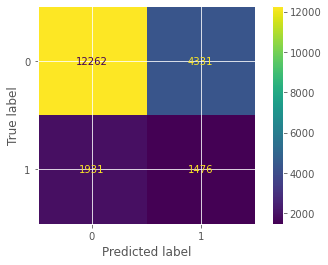

In [120]:
# Create and print confusion matrix
cnf_matrix_dt5 = metrics.confusion_matrix(Y_test_dt5, Y_preds_dt5)
print(cnf_matrix_dt5)
metrics.plot_confusion_matrix(best_grid_dt5, X_test_dt5, Y_test_dt5)
plt.show()

In [121]:
roc_auc_score(Y_test_dt5, best_grid_dt5.predict_proba(X_test_dt5)[:, 1])

0.6176332556910643

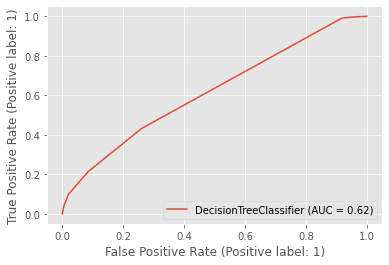

In [122]:
metrics.plot_roc_curve(best_grid_dt5, X_test_dt5, Y_test_dt5) 
plt.show()

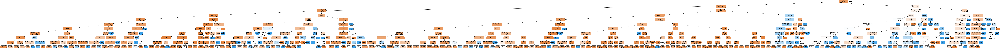

In [123]:
features_dt5=list(X_dt1.columns[0:])
dot_date = StringIO()
export_graphviz(best_grid_dt5, out_file=dot_data, feature_names=features_dt5, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

### Random Forest

In [124]:
# Preparing the data 
df_transformed_rad1 = pd.get_dummies(advertising)
df_transformed_rad1.rename(columns = {'y':'click'}, inplace = True)
X_rad1 = df_transformed_rad1.drop('click', axis=1)
Y_rad1 = df_transformed_rad1['click']
print(X_rad1.head(1))
print(Y_rad1.head(1))

   banner_pos  device_type  device_conn_type  dayofweek  day  hour  \
0           1            1                 0          1   28    14   

   site_domain_005b495a  site_domain_00dda4fc  site_domain_00e1b9c0  \
0                     0                     0                     0   

   site_domain_0150cc3e  ...  device_model_ff607a1a  device_model_ff717dd1  \
0                     0  ...                      0                      0   

   device_model_ff91ea03  device_model_ff963f16  device_model_ffb16766  \
0                      0                      0                      0   

   device_model_ffc70ef9  device_model_ffcd1497  device_model_ffceddb3  \
0                      0                      0                      0   

   device_model_ffe3ae81  device_model_ffe69079  
0                      0                      0  

[1 rows x 4618 columns]
0    0
Name: click, dtype: int64


In [125]:
# Get train and test dataset
X_train_rad1, X_test_rad1, Y_train_rad1, Y_test_rad1 = train_test_split( X_rad1, Y_rad1,test_size=0.3,stratify=Y_rad1,random_state=42)

In [126]:
#Import Dummy Classifier
from sklearn.dummy import DummyClassifier

In [127]:
# Using Most Frequent strategy of calculating the baseline accuracy
dummy_classifier_rad1 = DummyClassifier(strategy='most_frequent')
dummy_classifier_rad1.fit(X_train_rad1,Y_train_rad1)
baseline_acc_rad1 = dummy_classifier_rad1.score(X_test_rad1,Y_test_rad1)


### For verifying answer:
print("Baseline Accuracy = ", baseline_acc_rad1)

Baseline Accuracy =  0.8302


In [128]:
def create_bootstrap_sample(df):
    return df.sample(n= df.shape[0], replace = True)

bootstrap_sample_rad1 = create_bootstrap_sample(X_train_rad1)

print('Number of rows should be the same:')
print('Number of rows in X_train:  ', X_train_rad1.shape[0])
print('Number of rows in bootstrap:', create_bootstrap_sample(X_train_rad1).shape[0])

print(bootstrap_sample_rad1)

Number of rows should be the same:
Number of rows in X_train:   69999
Number of rows in bootstrap: 69999
       banner_pos  device_type  device_conn_type  dayofweek  day  hour  \
42635           0            1                 0          2   29    16   
52318           1            1                 0          1   28     6   
97142           0            1                 0          2   22     4   
99093           0            1                 0          0   27    12   
90159           0            1                 0          2   29    12   
...           ...          ...               ...        ...  ...   ...   
61182           1            1                 0          6   26     7   
92266           1            1                 0          2   29    10   
11437           0            1                 0          3   23    14   
77158           1            5                 0          2   29    23   
85182           0            1                 0          1   28    13   

      

In [129]:
from sklearn.metrics import (
    classification_report,
    recall_score,
    precision_score,
    accuracy_score
)

from sklearn.ensemble import RandomForestClassifier
model_rf_rad1 = RandomForestClassifier(n_estimators=10, max_features=7, random_state=42)
model_rf_rad1.fit(X_train_rad1, Y_train_rad1)
predict_rf_rad1 = model_rf_rad1.predict(X_test_rad1)
recall_rf_rad1 = recall_score(Y_test_rad1, predict_rf_rad1)
precision_rf_rad1 = precision_score(Y_test_rad1, predict_rf_rad1)

In [130]:
from sklearn.metrics import (
    classification_report,
    recall_score,
    precision_score,
    accuracy_score
)
print('Classification Report:\n')
print(classification_report(Y_test_rad1, predict_rf_rad1))

Classification Report:

              precision    recall  f1-score   support

           0       0.84      0.93      0.88     24906
           1       0.31      0.16      0.21      5094

    accuracy                           0.80     30000
   macro avg       0.58      0.54      0.55     30000
weighted avg       0.75      0.80      0.77     30000



In [131]:
def print_recall_scores(ensemble, feats, true_labels):
    '''
    Prints the recall scores for base estimators in a sklearn ensemble model.
    '''
    scores = []
    for model_idx, model in enumerate(ensemble.estimators_):
        if model_idx == 0:
            print('='*40)
        preds = model.predict(feats)
        scores.append(recall_score(true_labels, preds))
        model_recall = np.round(recall_score(true_labels, preds), 5)
        print(f'Recall for Base Model {model_idx+1}:\t', model_recall)
        if model_idx < (len(ensemble.estimators_) - 1):
            print('-'*40)
        else:
            print('='*40)
    ensemble_preds = ensemble.predict(feats)
    print("Mean Recall Score:\t\t", np.round(np.array(scores).mean(), 5))
    print("Std Deviation:\t\t\t", np.round(np.array(scores).std(), 5))
    print("Range:\t\t\t\t", np.round(np.array(scores).ptp(), 5))
    print(f'Overall Recall for model:\t {np.round(recall_score(true_labels, ensemble_preds), 5)}')

In [132]:
print_recall_scores(model_rf_rad1, X_test_rad1, Y_test_rad1)

Recall for Base Model 1:	 0.23596
----------------------------------------
Recall for Base Model 2:	 0.23204
----------------------------------------
Recall for Base Model 3:	 0.24323
----------------------------------------
Recall for Base Model 4:	 0.23204
----------------------------------------
Recall for Base Model 5:	 0.24853
----------------------------------------
Recall for Base Model 6:	 0.23204
----------------------------------------
Recall for Base Model 7:	 0.23871
----------------------------------------
Recall for Base Model 8:	 0.23263
----------------------------------------
Recall for Base Model 9:	 0.2395
----------------------------------------
Recall for Base Model 10:	 0.24303
Mean Recall Score:		 0.23777
Std Deviation:			 0.00553
Range:				 0.01649
Overall Recall for model:	 0.15685


In [133]:
from sklearn.ensemble import RandomForestClassifier

model_rf_oob_rad1 = RandomForestClassifier(n_estimators=100, max_features=7, oob_score=True, random_state=42).fit(X_train_rad1, Y_train_rad1)
oob_score_rad1 = round(model_rf_oob_rad1.oob_score_,4)
acc_oob_rad1 = round(accuracy_score(Y_test_rad1, model_rf_oob_rad1.predict(X_test_rad1)),4)
diff_oob_rad1 = round(abs(oob_score_rad1 - acc_oob_rad1),4)

print('OOB Score:\t\t\t', oob_score_rad1)
print('Testing Accuracy:\t\t', acc_oob_rad1)
print('Acc. Difference:\t\t', diff_oob_rad1)

OOB Score:			 0.7979
Testing Accuracy:		 0.8006
Acc. Difference:		 0.0027


In [134]:
#Feature Importance
feature_importances_rad1 = model_rf_rad1.feature_importances_
features_rad1 = X_train_rad1.columns
df_rad1 = pd.DataFrame({'features': features_rad1, 'importance': feature_importances_rad1}).nlargest
print(df_rad1)

<bound method DataFrame.nlargest of                    features  importance
0                banner_pos    0.008426
1               device_type    0.001242
2          device_conn_type    0.008503
3                 dayofweek    0.069708
4                       day    0.084229
...                     ...         ...
4613  device_model_ffc70ef9    0.000114
4614  device_model_ffcd1497    0.000051
4615  device_model_ffceddb3    0.000000
4616  device_model_ffe3ae81    0.000051
4617  device_model_ffe69079    0.000028

[4618 rows x 2 columns]>


In [135]:
Y_preds_rad1 = model_rf_rad1.predict(X_test_rad1)
accuracy_value_rad1 = metrics.accuracy_score(Y_test_rad1, Y_preds_rad1)
print("Accuracy", accuracy_value_rad1)
confusion_matrix(Y_test_rad1, Y_preds_rad1)
print(classification_report(Y_test_rad1, Y_preds_rad1))

Accuracy 0.7987333333333333
              precision    recall  f1-score   support

           0       0.84      0.93      0.88     24906
           1       0.31      0.16      0.21      5094

    accuracy                           0.80     30000
   macro avg       0.58      0.54      0.55     30000
weighted avg       0.75      0.80      0.77     30000



[[23163  1743]
 [ 4295   799]]


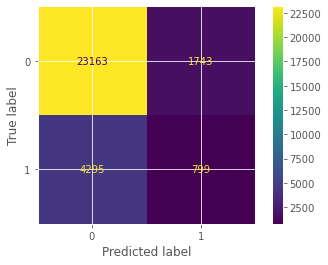

In [136]:
# Create and print confusion matrix
cnf_matrix_rad1 = metrics.confusion_matrix(Y_test_rad1, Y_preds_rad1)
print(cnf_matrix_rad1)
metrics.plot_confusion_matrix(model_rf_rad1, X_test_rad1, Y_test_rad1)
plt.show()

In [137]:
roc_auc_score(Y_test_rad1, model_rf_rad1.predict_proba(X_test_rad1)[:, 1])

0.623255730514146

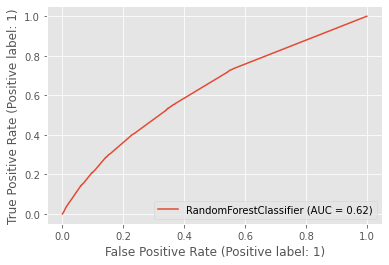

In [138]:
metrics.plot_roc_curve(model_rf_rad1, X_test_rad1, Y_test_rad1) 
plt.show()

In [139]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_rad1=cross_val_score(model_rf_rad1, X_train_rad1, Y_train_rad1,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_rad1))
print("Train SetAverage Cross Validation score :{}".format(score_train_rad1.mean()))
score_test_rad1=cross_val_score(model_rf_rad1, X_test_rad1, Y_test_rad1,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_rad1))
print("TestSetAverage Cross Validation score :{}".format(score_test_rad1.mean()))

Train Set Cross Validation Scores are [0.79535714 0.80057143 0.7995     0.79878571 0.79877134]
Train SetAverage Cross Validation score :0.7985971253048687
TestSet Cross Validation Scores are [0.812      0.8065     0.80516667 0.7975     0.788     ]
TestSetAverage Cross Validation score :0.8018333333333333


##### Random forest with Balanced weights

In [140]:
# Preparing the data
df_transformed_rad2 = pd.get_dummies(advertising)
df_transformed_rad2.rename(columns = {'y':'click'}, inplace = True)
X_rad2 = df_transformed_rad2.drop('click', axis=1)
Y_rad2 = df_transformed_rad2['click']
X_train_rad2, X_test_rad2, Y_train_rad2, Y_test_rad2 = train_test_split( X_rad2, Y_rad2,test_size=0.3,stratify=Y_rad2,random_state=42)

In [141]:
#Random Forest Classifier with balanced class weight
model_rf_rad2 = RandomForestClassifier(n_estimators=10, max_features=7, random_state=42, class_weight='balanced')
model_rf_rad2.fit(X_train_rad2, Y_train_rad2)
predict_rf_rad2 = model_rf_rad2.predict(X_test_rad2)
recall_rf_rad2 = recall_score(Y_test_rad2, predict_rf_rad2)
precision_rf_rad2 = precision_score(Y_test_rad2, predict_rf_rad2)

In [142]:
print('Classification Report:\n')
print(classification_report(Y_test_rad2, predict_rf_rad2))

Classification Report:

              precision    recall  f1-score   support

           0       0.84      0.91      0.88     24906
           1       0.29      0.18      0.23      5094

    accuracy                           0.79     30000
   macro avg       0.57      0.55      0.55     30000
weighted avg       0.75      0.79      0.77     30000



In [143]:
print_recall_scores(model_rf_rad2, X_test_rad2, Y_test_rad2)

Recall for Base Model 1:	 0.28072
----------------------------------------
Recall for Base Model 2:	 0.28072
----------------------------------------
Recall for Base Model 3:	 0.28759
----------------------------------------
Recall for Base Model 4:	 0.27778
----------------------------------------
Recall for Base Model 5:	 0.27621
----------------------------------------
Recall for Base Model 6:	 0.27503
----------------------------------------
Recall for Base Model 7:	 0.27091
----------------------------------------
Recall for Base Model 8:	 0.26247
----------------------------------------
Recall for Base Model 9:	 0.27091
----------------------------------------
Recall for Base Model 10:	 0.27719
Mean Recall Score:		 0.27595
Std Deviation:			 0.00648
Range:				 0.02513
Overall Recall for model:	 0.18414


In [144]:
# OOB to true
model_rf_oob_rad2 = RandomForestClassifier(n_estimators=100, max_features=7, oob_score=True, random_state=42, class_weight='balanced').fit(X_train_rad2, Y_train_rad2)
oob_score_rad2 = round(model_rf_oob_rad2.oob_score_,4)
acc_oob_rad2 = round(accuracy_score(Y_test_rad2, model_rf_oob_rad2.predict(X_test_rad2)),4)
diff_oob_rad2 = round(abs(oob_score_rad2 - acc_oob_rad2),4)

print('OOB Score:\t\t\t', oob_score_rad2)
print('Testing Accuracy:\t\t', acc_oob_rad2)
print('Acc. Difference:\t\t', diff_oob_rad2)

OOB Score:			 0.7823
Testing Accuracy:		 0.7846
Acc. Difference:		 0.0023


In [145]:
#Feature Importance
feature_importances_rad2 = model_rf_rad2.feature_importances_
features_rad2 = X_train_rad2.columns
df_rad2 = pd.DataFrame({'features': features_rad2, 'importance': feature_importances_rad2}).nlargest
print(df_rad2)

<bound method DataFrame.nlargest of                    features  importance
0                banner_pos    0.010242
1               device_type    0.001749
2          device_conn_type    0.010970
3                 dayofweek    0.066038
4                       day    0.078672
...                     ...         ...
4613  device_model_ffc70ef9    0.000106
4614  device_model_ffcd1497    0.000023
4615  device_model_ffceddb3    0.000000
4616  device_model_ffe3ae81    0.000028
4617  device_model_ffe69079    0.000073

[4618 rows x 2 columns]>


In [146]:
Y_preds_rad2 = model_rf_rad2.predict(X_test_rad2)
accuracy_value_rad2 = metrics.accuracy_score(Y_test_rad2, Y_preds_rad2)
print("Accuracy", accuracy_value_rad2)
confusion_matrix(Y_test_rad2, Y_preds_rad2)
print(classification_report(Y_test_rad2, Y_preds_rad2))

Accuracy 0.7858666666666667
              precision    recall  f1-score   support

           0       0.84      0.91      0.88     24906
           1       0.29      0.18      0.23      5094

    accuracy                           0.79     30000
   macro avg       0.57      0.55      0.55     30000
weighted avg       0.75      0.79      0.77     30000



[[22638  2268]
 [ 4156   938]]


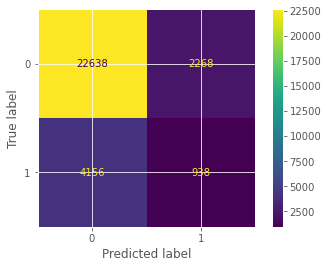

In [147]:
# Create and print confusion matrix
cnf_matrix_rad2 = metrics.confusion_matrix(Y_test_rad2, Y_preds_rad2)
print(cnf_matrix_rad2)
metrics.plot_confusion_matrix(model_rf_rad2, X_test_rad2, Y_test_rad2)
plt.show()

In [148]:
roc_auc_score(Y_test_rad2, model_rf_rad2.predict_proba(X_test_rad2)[:, 1])

0.6162801146839009

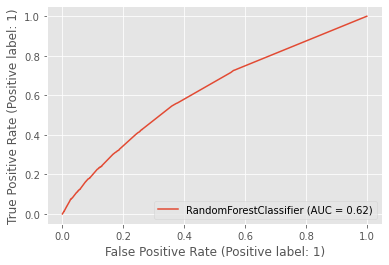

In [149]:
metrics.plot_roc_curve(model_rf_rad2, X_test_rad2, Y_test_rad2) 
plt.show()

In [150]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_rad2=cross_val_score(model_rf_rad2, X_train_rad2, Y_train_rad2,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_rad2))
print("Train SetAverage Cross Validation score :{}".format(score_train_rad2.mean()))
score_test_rad2=cross_val_score(model_rf_rad2, X_test_rad2, Y_test_rad2,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_rad2))
print("TestSetAverage Cross Validation score :{}".format(score_test_rad2.mean()))

Train Set Cross Validation Scores are [0.78242857 0.78678571 0.78428571 0.78735714 0.78855633]
Train SetAverage Cross Validation score :0.7858826936617922
TestSet Cross Validation Scores are [0.80283333 0.80183333 0.7925     0.789      0.7885    ]
TestSetAverage Cross Validation score :0.7949333333333334


### Logistic Regression

In [151]:
# Preparing the dataset
df_transformed_lr1 = pd.get_dummies(advertising)
df_transformed_lr1.rename(columns = {'y':'click'}, inplace = True)
X_lr1 = df_transformed_lr1.drop('click', axis=1)
Y_lr1 = df_transformed_lr1['click']
X_train_lr1, X_test_lr1, Y_train_lr1, Y_test_lr1 = train_test_split(X_lr1, Y_lr1, test_size=0.2, random_state=0)

In [152]:
# Fit training data to Logistic Regression Model
from sklearn.linear_model import LogisticRegression

# diclare the logistic model
model_lr1 = LogisticRegression()

# train the model on the data
model_lr1.fit(X_train_lr1, Y_train_lr1)

LogisticRegression()

In [153]:
model_lr1.coef_

array([[ 0.20102457, -0.26027815, -0.07329829, ...,  0.0085925 ,
         0.00490162, -0.01578329]])

In [154]:
model_lr1.coef_.shape

(1, 4618)

Accuracy 0.82995
              precision    recall  f1-score   support

           0       0.83      0.99      0.91     16593
           1       0.51      0.03      0.06      3407

    accuracy                           0.83     20000
   macro avg       0.67      0.51      0.49     20000
weighted avg       0.78      0.83      0.76     20000

[[16481   112]
 [ 3289   118]]


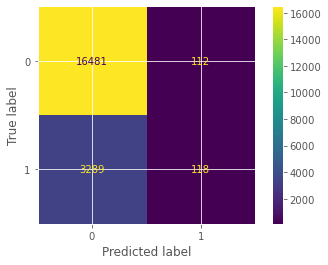

In [155]:
# Use the testing data to make predictions and determine the accuracy of your predictions.
Y_pred_lr1 = model_lr1.predict(X_test_lr1)
accuracy_value_lr1 = metrics.accuracy_score(Y_test_lr1, Y_pred_lr1)
print("Accuracy", accuracy_value_lr1)
confusion_matrix(Y_test_lr1, Y_pred_lr1)
print(classification_report(Y_test_lr1, Y_pred_lr1))

# Plot and print confusion matrix
cnf_matrix_lr1 = metrics.confusion_matrix(Y_test_lr1, Y_pred_lr1)
print(cnf_matrix_lr1)
# Plot confusion matrix
metrics.plot_confusion_matrix(model_lr1, X_test_lr1, Y_test_lr1)
plt.show()

[[16593     0]
 [ 3407     0]]


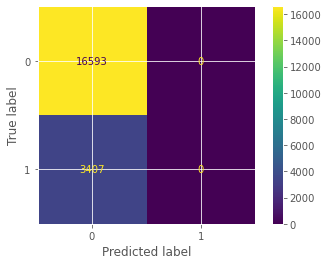

In [156]:
# Calculating a base line for comparing the model. 
from sklearn.dummy import DummyClassifier
dummy_clf_lr1 = DummyClassifier(strategy="most_frequent")
dummy_clf_lr1.fit(X_train_lr1, Y_train_lr1)
Y_pred_lr1 = dummy_clf_lr1.predict(X_test_lr1)

# Plot and print confusion matrix
cnf_matrix_dummy_lr1 = metrics.confusion_matrix(Y_test_lr1, Y_pred_lr1)
print(cnf_matrix_dummy_lr1)
metrics.plot_confusion_matrix(dummy_clf_lr1, X_test_lr1, Y_test_lr1)
plt.show()

In [157]:
roc_auc_score(Y_test_lr1, model_lr1.predict_proba(X_test_lr1)[:, 1])

0.6941979380974266

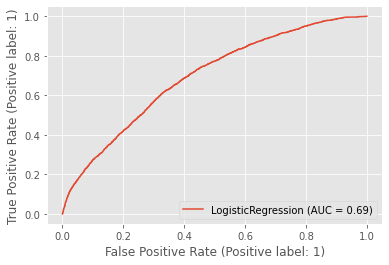

In [158]:
metrics.plot_roc_curve(model_lr1, X_test_lr1, Y_test_lr1) 
plt.show()

In [159]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_lr1=cross_val_score(model_lr1, X_train_lr1, Y_train_lr1,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_lr1))
print("Train SetAverage Cross Validation score :{}".format(score_train_lr1.mean()))
score_test_lr1=cross_val_score(model_lr1, X_test_lr1, Y_test_lr1,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_lr1))
print("TestSetAverage Cross Validation score :{}".format(score_test_lr1.mean()))

Train Set Cross Validation Scores are [0.828      0.8320625  0.8298125  0.830875   0.82605163]
Train SetAverage Cross Validation score :0.829360325645353
TestSet Cross Validation Scores are [0.8325  0.82425 0.83175 0.83425 0.8305 ]
TestSetAverage Cross Validation score :0.83065


Evaluatation with balanced weight

In [160]:
# Preparing the dataset
df_transformed_lr2 = pd.get_dummies(advertising)
df_transformed_lr2.rename(columns = {'y':'click'}, inplace = True)
X_lr2 = df_transformed_lr2.drop('click', axis=1)
Y_lr2 = df_transformed_lr2['click']
X_train_lr2, X_test_lr2, Y_train_lr2, Y_test_lr2 = train_test_split(X_lr2, Y_lr2, test_size=0.2, random_state=0)

In [161]:
# Fit training data to Logistic Regression Model
from sklearn.linear_model import LogisticRegression

In [162]:
# diclare the logistic model
model_lr2 = LogisticRegression(class_weight='balanced')

In [163]:
# train the model on the data
model_lr2.fit(X_train_lr2, Y_train_lr2)

LogisticRegression(class_weight='balanced')

In [164]:
model_lr2.coef_

array([[ 0.35556216, -0.29706144,  0.00412696, ...,  0.01371753,
         0.00567244, -0.02680882]])

In [165]:
model_lr2.coef_.shape

(1, 4618)

In [166]:
# Use the testing data to make predictions and determine the accuracy of your predictions.
Y_pred_lr2 = model_lr2.predict(X_test_lr2)
accuracy_value_lr2 = metrics.accuracy_score(Y_test_lr2, Y_pred_lr2)
print("Accuracy", accuracy_value_lr2)
confusion_matrix(Y_test_lr2, Y_pred_lr2)
print(classification_report(Y_test_lr2, Y_pred_lr2))

Accuracy 0.605
              precision    recall  f1-score   support

           0       0.91      0.58      0.71     16593
           1       0.26      0.71      0.38      3407

    accuracy                           0.60     20000
   macro avg       0.58      0.65      0.54     20000
weighted avg       0.80      0.60      0.65     20000



[[9691 6902]
 [ 998 2409]]


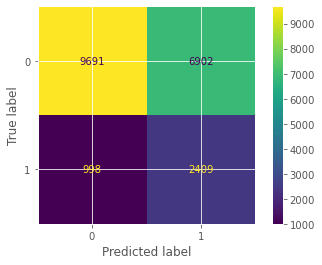

In [167]:
# Plot and print confusion matrix
cnf_matrix_lr2 = metrics.confusion_matrix(Y_test_lr2, Y_pred_lr2)
print(cnf_matrix_lr2)
# Plot confusion matrix
metrics.plot_confusion_matrix(model_lr2, X_test_lr2, Y_test_lr2)
plt.show()

In [168]:
roc_auc_score(Y_test_lr2, model_lr2.predict_proba(X_test_lr2)[:, 1])

0.7020831045926254

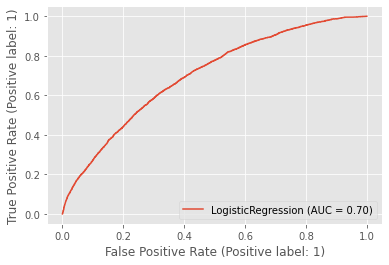

In [169]:
metrics.plot_roc_curve(model_lr2, X_test_lr2, Y_test_lr2) 
plt.show()

In [170]:
# Cross Validation
kf=KFold(n_splits=5)
score_train_lr2=cross_val_score(model_lr2, X_train_lr2, Y_train_lr2,cv=kf)
print("Train Set Cross Validation Scores are {}".format(score_train_lr2))
print("Train SetAverage Cross Validation score :{}".format(score_train_lr2.mean()))
score_test_lr2=cross_val_score(model_lr2, X_test_lr2, Y_test_lr2,cv=kf)
print("TestSet Cross Validation Scores are {}".format(score_test_lr2))
print("TestSetAverage Cross Validation score :{}".format(score_test_lr2.mean()))

Train Set Cross Validation Scores are [0.6021875  0.6071875  0.6125625  0.6159375  0.59466217]
Train SetAverage Cross Validation score :0.6065074332770799
TestSet Cross Validation Scores are [0.60875 0.62675 0.63425 0.61625 0.62775]
TestSetAverage Cross Validation score :0.6227499999999999
